# Notebook 02 — Cluster Centroid Products

**Replication of Bach et al. (2025) — Adventures in Demand Analysis Using AI**  
Applied to: Amazon Women's Shoes (Size 8)

---

This notebook visualizes product clusters in embedding space and identifies
the centroid products for each cluster.

Pipeline:
1. Load analysis-ready datasets from notebook 01
2. Load text-only and multimodal embeddings
3. Run KMeans clustering (5 clusters) on both embedding types
4. PCA visualization of clusters (2D and 3D)
5. Find 4 nearest products to each cluster centroid
6. Display product images and descriptions for each cluster centroid

## ① Mount Drive

In [1]:
# Local mode - no Google Drive needed
print('Local mode')

Local mode


## ② Set Working Directory

In [2]:
import os, sys
from pathlib import Path

# Local mode - no Google Drive needed
_cwd = Path.cwd()
PROJECT_ROOT = _cwd
for _ in range(5):
    if (PROJECT_ROOT / 'data').is_dir() and (PROJECT_ROOT / 'code').is_dir():
        break
    PROJECT_ROOT = PROJECT_ROOT.parent
else:
    raise RuntimeError("Cannot find project root")

CODE_DIR = str(PROJECT_ROOT / 'code')
os.chdir(CODE_DIR)
sys.path.insert(0, CODE_DIR)
print(f'Working directory: {os.getcwd()}')

Working directory: /home/iankuzuma/claude_code/demand-modeling-data-men-8/women-8-subcat-split/fashion-sneakers/code


## ③ Imports

In [3]:
import os
import datasets
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm

from pathlib import Path
from PIL import Image, ImageDraw, ImageFont
import textwrap
from IPython.display import display

from sklearn.cluster import KMeans
from sklearn.preprocessing import PolynomialFeatures, StandardScaler, normalize
from sklearn.decomposition import PCA
from sklearn.metrics import r2_score, pairwise_distances
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from lightgbm import LGBMRegressor

from utils.utils_data2 import (
    load_pred_and_emb,
    center_and_norm,
    get_pca,
    get_cluster,
    get_similarities,
    add_lags_and_scale_data,
)
print('✅ Imports done')

✅ Imports done


## ④ Output Directory

In [4]:
ROOT = str(PROJECT_ROOT) + '/'
output_dir = ROOT + 'output/02_cluster_centroid_products'
os.makedirs(output_dir, exist_ok=True)
print(f'✅ Output dir ready: {output_dir}')

✅ Output dir ready: /home/iankuzuma/claude_code/demand-modeling-data-men-8/women-8-subcat-split/fashion-sneakers/output/02_cluster_centroid_products


## ⑤ Load Analysis-Ready Datasets

Loads the output from notebook 01_1 (multimodal embeddings dataset).
`dropna()` removes the first-period rows with no lag features — same as paper.

In [5]:
txt_only = False
include_embeddings = True
dataframe_name = f"dataset_txt_only_{txt_only}_embeddings_{include_embeddings}"

df_full_train = pd.read_csv(f"../data/{dataframe_name}_train.zip")
df_full_val   = pd.read_csv(f"../data/{dataframe_name}_val.zip")

df_full_train = df_full_train.dropna()
df_full_val   = df_full_val.dropna()

dummy_subcat_names = [category for category in df_full_val["subcat_aggregated"].unique()]
all_time_steps = sorted([str(date) for date in df_full_val["date"].unique()])

print(f"Train shape: {df_full_train.shape}")
print(f"Val shape:   {df_full_val.shape}")
print(f"Subcat names: {dummy_subcat_names}")
print(f"Time steps: {all_time_steps}")

# Set datetime index — required for joining embeddings later
df_full_train["date"] = pd.to_datetime(df_full_train["date"])
df_full_val["date"]   = pd.to_datetime(df_full_val["date"])
df_full_train = df_full_train.set_index(["ASIN", "date"])
df_full_val   = df_full_val.set_index(["ASIN", "date"])
print(f"\nIndex set — train: {df_full_train.shape}, val: {df_full_val.shape}")

Train shape: (5160, 327)
Val shape:   (5160, 327)
Subcat names: ['Fashion Sneakers']
Time steps: ['2025-04-28', '2025-05-26', '2025-06-23', '2025-07-21', '2025-08-18', '2025-09-15', '2025-10-13', '2025-11-10', '2025-12-08', '2026-01-05', '2026-02-02', '2026-03-02']

Index set — train: (5160, 325), val: (5160, 325)


## ⑥ Load Image Parquet

Loads the image lookup table created in Part 6.
Used later to display product photos for each cluster centroid.

In [6]:
data_files = {
    "train": [f"train-0000{i}-of-00004-part00{j}.parquet" for i in range(4) for j in range(4)],
}

# ── SHOES IMAGE DATASET ────────────────────────────────────────────────────
ds_img = datasets.load_dataset(
    "parquet",
    data_dir="../data/amzn_shoes_monthly_avg_long_ffill_28_7_images",
    data_files=data_files,
)
# ───────────────────────────────────────────────────────────────────────────

df_img = ds_img["train"].to_pandas()
print(f"Image lookup table: {df_img.shape}")
print(f"Columns: {df_img.columns.tolist()}")

Generating train split: 0 examples [00:00, ? examples/s]

Image lookup table: (860, 2)
Columns: ['ASIN', 'image']


## ⑦ Load Text-Only Embeddings

In [7]:
# Load txt-only embeddings directly from the saved dataset (notebook 01_2 output)
# This is more reliable than loading from prediction zip files
# because it is already aligned with the same (ASIN, date) pairs

df_txt_train = pd.read_csv('../data/dataset_txt_only_True_embeddings_True_train.zip')
df_txt_val   = pd.read_csv('../data/dataset_txt_only_True_embeddings_True_val.zip')

df_txt_train = df_txt_train.dropna()
df_txt_val   = df_txt_val.dropna()

print(f'txt-only train shape: {df_txt_train.shape}')
print(f'txt-only val shape:   {df_txt_val.shape}')

txt-only train shape: (5160, 327)
txt-only val shape:   (5160, 327)


## ⑧ Join Text Embeddings to Datasets

Joins the `_txt` suffixed embedding columns to df_full_train and df_full_val.
Date is converted to datetime to ensure index alignment.

In [8]:
# Extract emb_* columns from txt-only dataset and rename to emb_*_txt
# Then join to df_full_train and df_full_val on (ASIN, date)

txt_emb_cols = [f'emb_{i}' for i in range(256)]

df_txt_train['date'] = pd.to_datetime(df_txt_train['date'])
df_txt_val['date']   = pd.to_datetime(df_txt_val['date'])

train_emb_txt = df_txt_train[['ASIN', 'date'] + txt_emb_cols].copy()
train_emb_txt = train_emb_txt.set_index(['ASIN', 'date'])
train_emb_txt.columns = [f'{c}_txt' for c in train_emb_txt.columns]

val_emb_txt = df_txt_val[['ASIN', 'date'] + txt_emb_cols].copy()
val_emb_txt = val_emb_txt.set_index(['ASIN', 'date'])
val_emb_txt.columns = [f'{c}_txt' for c in val_emb_txt.columns]

# Ensure datetime index on df_full_train and df_full_val
df_full_train.index = df_full_train.index.set_levels(
    pd.to_datetime(df_full_train.index.get_level_values('date').unique()), level='date'
)
df_full_val.index = df_full_val.index.set_levels(
    pd.to_datetime(df_full_val.index.get_level_values('date').unique()), level='date'
)

df_full_train = df_full_train.join(train_emb_txt)
df_full_val   = df_full_val.join(val_emb_txt)

txt_cols_train = [c for c in df_full_train.columns if '_txt' in c]
txt_cols_val   = [c for c in df_full_val.columns   if '_txt' in c]
print(f'_txt columns in train: {len(txt_cols_train)}')
print(f'_txt columns in val:   {len(txt_cols_val)}')
print(f'df_full_train shape: {df_full_train.shape}')
print(f'df_full_val shape:   {df_full_val.shape}')
assert len(txt_cols_train) == 256, f'Expected 256 _txt columns, got {len(txt_cols_train)}'
print('✅ txt embeddings joined successfully')

_txt columns in train: 256
_txt columns in val:   256
df_full_train shape: (5160, 581)
df_full_val shape:   (5160, 581)
✅ txt embeddings joined successfully


## ⑨ Define Embedding Column Lists

In [9]:
emb_columns     = ["ASIN", "date"] + [f"emb_{i}"     for i in range(256)]
emb_columns_txt = ["ASIN", "date"] + [f"emb_{i}_txt" for i in range(256)]
print(f"txtimg emb columns: {len(emb_columns)-2}")
print(f"txt emb columns:    {len(emb_columns_txt)-2}")

txtimg emb columns: 256
txt emb columns:    256


## ⑩ Center and Normalize Embeddings

Combines train + val embeddings, centers and normalizes for clustering.
Dedup applied to remove any duplicate (ASIN, date) pairs.

In [10]:
full_embeddings_txtimg = center_and_norm(
    df_full_train.reset_index()[emb_columns],
    df_full_val.reset_index()[emb_columns]
)
full_embeddings_txtimg = full_embeddings_txtimg[~full_embeddings_txtimg.index.duplicated(keep='last')]
print(f"txtimg embeddings shape: {full_embeddings_txtimg.shape}")

full_embeddings_txt = center_and_norm(
    df_full_train.reset_index()[emb_columns_txt],
    df_full_val.reset_index()[emb_columns_txt]
)
full_embeddings_txt = full_embeddings_txt[~full_embeddings_txt.index.duplicated(keep='last')]
print(f"txt embeddings shape:    {full_embeddings_txt.shape}")

txtimg embeddings shape: (10320, 256)


txt embeddings shape:    (10320, 256)


## ⑪ KMeans Clustering (5 clusters)

In [11]:
kmeans_txt_labels,    cluster_centroids_txt    = get_cluster(full_embeddings_txt,    n_clusters=5)
kmeans_txtimg_labels, cluster_centroids_txtimg = get_cluster(full_embeddings_txtimg, n_clusters=5)

print(f"txt cluster distribution:    {dict(zip(*np.unique(kmeans_txt_labels,    return_counts=True)))}")
print(f"txtimg cluster distribution: {dict(zip(*np.unique(kmeans_txtimg_labels, return_counts=True)))}")

txt cluster distribution:    {np.int32(0): np.int64(1668), np.int32(1): np.int64(2856), np.int32(2): np.int64(1056), np.int32(3): np.int64(2328), np.int32(4): np.int64(2412)}
txtimg cluster distribution: {np.int32(0): np.int64(1348), np.int32(1): np.int64(2360), np.int32(2): np.int64(2606), np.int32(3): np.int64(1363), np.int32(4): np.int64(2643)}


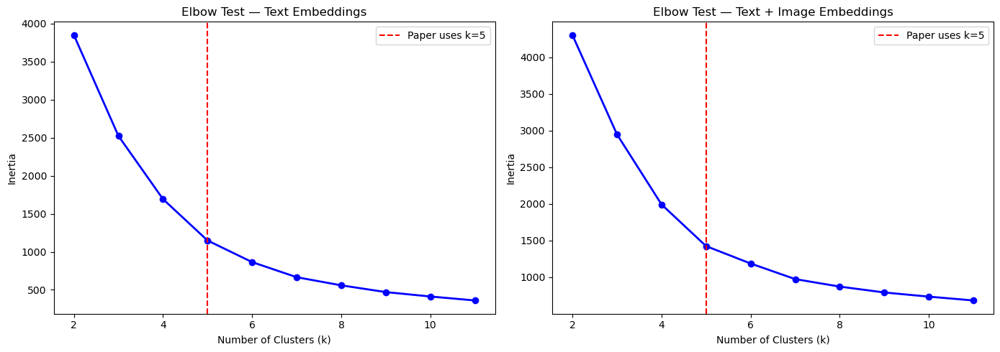

✅ Elbow test saved — check elbow_test.png to decide on optimal k
   Red line shows k=5 used by the paper


In [12]:
# ── Optional: Elbow Test to explore optimal number of clusters ─────────────
# This cell is exploratory only — the main pipeline uses n_clusters=5
# following Bach et al. (2025) exactly.

from sklearn.cluster import KMeans

k_range = range(2, 12)
inertia_txtimg = []
inertia_txt    = []

for k in k_range:
    km_img = KMeans(n_clusters=k, random_state=42, n_init=10)
    km_img.fit(full_embeddings_txtimg)
    inertia_txtimg.append(km_img.inertia_)

    km_txt = KMeans(n_clusters=k, random_state=42, n_init=10)
    km_txt.fit(full_embeddings_txt)
    inertia_txt.append(km_txt.inertia_)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(k_range, inertia_txt, 'bo-', linewidth=2)
axes[0].axvline(x=5, color='red', linestyle='--', label='Paper uses k=5')
axes[0].set_title("Elbow Test — Text Embeddings")
axes[0].set_xlabel("Number of Clusters (k)")
axes[0].set_ylabel("Inertia")
axes[0].legend()

axes[1].plot(k_range, inertia_txtimg, 'bo-', linewidth=2)
axes[1].axvline(x=5, color='red', linestyle='--', label='Paper uses k=5')
axes[1].set_title("Elbow Test — Text + Image Embeddings")
axes[1].set_xlabel("Number of Clusters (k)")
axes[1].set_ylabel("Inertia")
axes[1].legend()

plt.tight_layout()
plt.savefig(os.path.join(output_dir, "elbow_test.png"), dpi=150)
plt.show()
print("✅ Elbow test saved — check elbow_test.png to decide on optimal k")
print("   Red line shows k=5 used by the paper")

## ⑫ PCA 2D Visualization

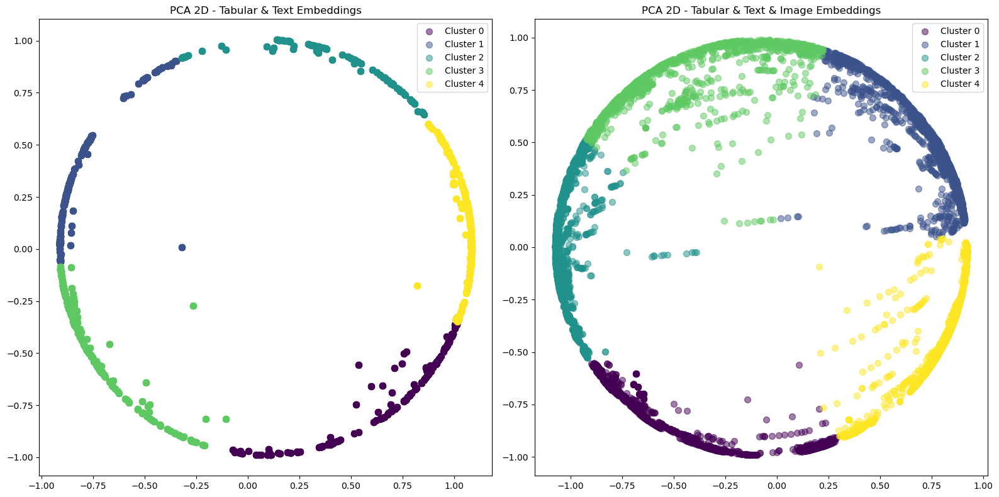

✅ Saved pca_2d_clusters.png


In [13]:
pca_img = PCA(n_components=2, random_state=42)
pca_img_results = pca_img.fit_transform(full_embeddings_txtimg)

pca_txt = PCA(n_components=2, random_state=42)
pca_txt_results = pca_txt.fit_transform(full_embeddings_txt)

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

unique_cluster_ids = np.unique(kmeans_txt_labels)
colors = cm.viridis(np.linspace(0, 1, len(unique_cluster_ids)))
for i, cluster_id in enumerate(unique_cluster_ids):
    axes[0].scatter(
        pca_txt_results[kmeans_txt_labels == cluster_id, 0],
        pca_txt_results[kmeans_txt_labels == cluster_id, 1],
        color=colors[i], label=f"Cluster {cluster_id}", s=50, alpha=0.5,
    )
axes[0].set_title("PCA 2D - Tabular & Text Embeddings")
axes[0].legend()

unique_cluster_ids = np.unique(kmeans_txtimg_labels)
colors = cm.viridis(np.linspace(0, 1, len(unique_cluster_ids)))
for i, cluster_id in enumerate(unique_cluster_ids):
    axes[1].scatter(
        pca_img_results[kmeans_txtimg_labels == cluster_id, 0],
        pca_img_results[kmeans_txtimg_labels == cluster_id, 1],
        color=colors[i], label=f"Cluster {cluster_id}", s=50, alpha=0.5,
    )
axes[1].set_title("PCA 2D - Tabular & Text & Image Embeddings")
axes[1].legend()

plt.tight_layout()
plt.savefig(os.path.join(output_dir, "pca_2d_clusters.png"), dpi=150)
plt.show()
print("✅ Saved pca_2d_clusters.png")

## ⑬ PCA 2D — Image Only

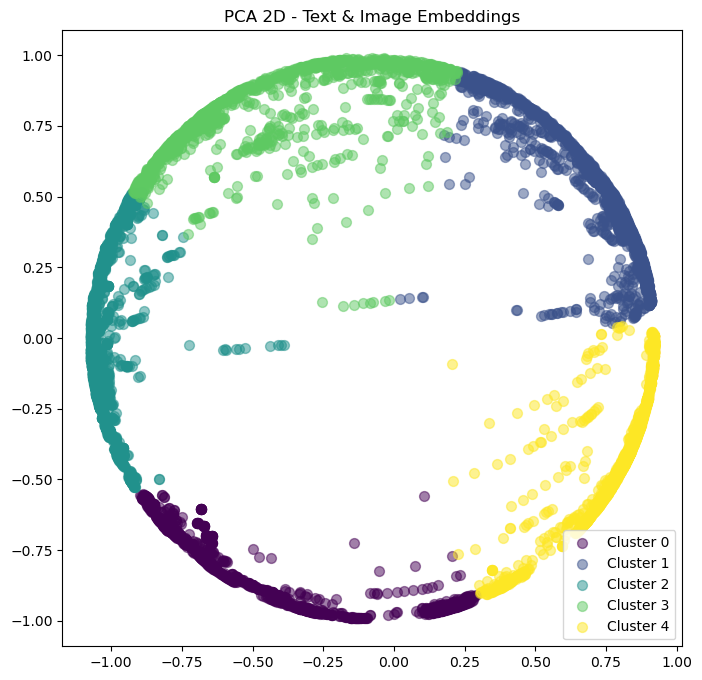

✅ Saved pca_img_clusters.png


In [14]:
fig = plt.figure(figsize=(8, 8))
unique_cluster_ids = np.unique(kmeans_txtimg_labels)
colors = cm.viridis(np.linspace(0, 1, len(unique_cluster_ids)))
for i, cluster_id in enumerate(unique_cluster_ids):
    plt.scatter(
        pca_img_results[kmeans_txtimg_labels == cluster_id, 0],
        pca_img_results[kmeans_txtimg_labels == cluster_id, 1],
        color=colors[i], label=f"Cluster {cluster_id}", s=50, alpha=0.5,
    )
plt.title("PCA 2D - Text & Image Embeddings")
plt.legend()
plt.savefig(os.path.join(output_dir, "pca_img_clusters.png"), dpi=150)
plt.show()
print("✅ Saved pca_img_clusters.png")

## ⑭ PCA 3D Visualization

In [15]:
pca_img_3d = PCA(n_components=3, random_state=42)
pca_img_3d_results = pca_img_3d.fit_transform(full_embeddings_txtimg)

pca_txt_3d = PCA(n_components=3, random_state=42)
pca_txt_3d_results = pca_txt_3d.fit_transform(full_embeddings_txt)

import plotly.graph_objs as go
from plotly.subplots import make_subplots
import matplotlib.colors as mcolors

unique_cluster_ids_img = np.unique(kmeans_txtimg_labels)
unique_cluster_ids_txt = np.unique(kmeans_txt_labels)
colors_img = [mcolors.rgb2hex(cm.viridis(i)) for i in np.linspace(0, 1, len(unique_cluster_ids_img))]
colors_txt = [mcolors.rgb2hex(cm.viridis(i)) for i in np.linspace(0, 1, len(unique_cluster_ids_txt))]

fig = make_subplots(
    rows=1, cols=2,
    specs=[[{"type": "scatter3d"}, {"type": "scatter3d"}]],
    subplot_titles=("Tabular & Text Embeddings", "Tabular & Text & Image Embeddings"),
)

for i, cluster_id in enumerate(unique_cluster_ids_txt):
    mask = kmeans_txt_labels == cluster_id
    fig.add_trace(go.Scatter3d(
        x=pca_txt_3d_results[mask, 0], y=pca_txt_3d_results[mask, 1], z=pca_txt_3d_results[mask, 2],
        mode="markers", marker=dict(size=5, color=colors_txt[i], opacity=0.3),
        name=f"Cluster {cluster_id}", showlegend=True,
    ), row=1, col=1)

for i, cluster_id in enumerate(unique_cluster_ids_img):
    mask = kmeans_txtimg_labels == cluster_id
    fig.add_trace(go.Scatter3d(
        x=pca_img_3d_results[mask, 0], y=pca_img_3d_results[mask, 1], z=pca_img_3d_results[mask, 2],
        mode="markers", marker=dict(size=5, color=colors_img[i], opacity=0.3),
        name=f"Cluster {cluster_id}", showlegend=False,
    ), row=1, col=2)

fig.update_layout(height=600, width=900, title_text="PCA 3D Cluster Visualization")
fig.show()
print("✅ 3D plot rendered")

✅ 3D plot rendered


## ⑮ Combine Train + Val for Centroid Search

In [16]:
df_full = pd.concat([df_full_train, df_full_val]).reset_index()
print(f"df_full shape: {df_full.shape}")
df_full.head()

df_full shape: (10320, 583)


,ASIN,date,Q_t,PRICE,P_bb_t,text,window,REVIEW_COUNT,RATING,New Offer Count: Current,...,emb_246_txt,emb_247_txt,emb_248_txt,emb_249_txt,emb_250_txt,emb_251_txt,emb_252_txt,emb_253_txt,emb_254_txt,emb_255_txt
0,B006W47SMQ,2025-04-28,-7.406949,3.964026,3.868220,"Reebok Princess Sneakers for Women, Comfortabl...",28.0,40553.0,4.4,2,...,0.057992,0.057769,0.141335,0.05349,-0.022076,0.058318,0.099257,0.026634,0.034593,-0.013292
1,B006W47SMQ,2025-05-26,-7.574742,3.896068,3.861414,"Reebok Princess Sneakers for Women, Comfortabl...",28.0,40870.0,4.4,2,...,0.057992,0.057769,0.141335,0.05349,-0.022076,0.058318,0.099257,0.026634,0.034593,-0.013292
2,B006W47SMQ,2025-06-23,-7.753394,3.937914,3.933029,"Reebok Princess Sneakers for Women, Comfortabl...",28.0,40843.0,4.4,2,...,0.057992,0.057769,0.141335,0.05349,-0.022076,0.058318,0.099257,0.026634,0.034593,-0.013292
3,B006W47SMQ,2025-07-21,-7.598381,3.970103,3.719409,"Reebok Princess Sneakers for Women, Comfortabl...",28.0,41145.0,4.4,2,...,0.057992,0.057769,0.141335,0.05349,-0.022076,0.058318,0.099257,0.026634,0.034593,-0.013292
4,B006W47SMQ,2025-08-18,-7.783804,4.141751,3.818957,"Reebok Princess Sneakers for Women, Comfortabl...",28.0,41313.0,4.4,1,...,0.057992,0.057769,0.141335,0.05349,-0.022076,0.058318,0.099257,0.026634,0.034593,-0.013292


## ⑯ Cluster Similarity Features

In [17]:
n_clusters = 5

centroids_img = cluster_centroids_txtimg
cl_img = [f"similarity_cluster_img_{i}" for i in range(n_clusters)]

centroids_txt = cluster_centroids_txt
cl_txt = [f"similarity_cluster_txt_{i}" for i in range(n_clusters)]
df_full_val.loc[:, cl_txt]   = np.nan
df_full_train.loc[:, cl_txt] = np.nan
df_full.loc[:, cl_txt]       = np.nan
print("✅ Similarity columns initialized")

✅ Similarity columns initialized


## ⑰ Compute Similarities to Centroids

In [18]:
for i_embedding, embedding in enumerate(full_embeddings_txtimg.values):
    for i, centroid in enumerate(centroids_img):
        similarity = 1.0 - pairwise_distances(
            embedding.reshape(1, -1), centroid.reshape(1, -1), metric="cosine"
        )
        df_full.loc[i_embedding, cl_img[i]] = similarity

for i_embedding, embedding in enumerate(full_embeddings_txt.values):
    for i, centroid in enumerate(centroids_txt):
        similarity = 1.0 - pairwise_distances(
            embedding.reshape(1, -1), centroid.reshape(1, -1), metric="cosine"
        )
        df_full.loc[i_embedding, cl_txt[i]] = similarity

print("✅ Similarities computed")

✅ Similarities computed


## ⑱ Find Closest Products to Each Centroid

In [19]:
n_neighbors = 4
closest_points_img = [None]

for embeddings, centroids, val_cluster_ids in zip(
    [full_embeddings_txtimg], [centroids_img], [kmeans_txtimg_labels]
):
    for i_embedding, embedding in enumerate([embeddings]):
        distances = pairwise_distances(embedding, centroids, metric="euclidean")
        closest_points_indices = []
        for i in range(n_clusters):
            cluster_indices   = np.where(val_cluster_ids == i)[0]
            cluster_distances = distances[cluster_indices, i]
            sorted_indices    = cluster_indices[np.argsort(cluster_distances)]
            closest_indices_i = []
            seen_asins = set()
            for idx in sorted_indices:
                asin = df_full.loc[idx, "ASIN"]
                if asin not in seen_asins:
                    closest_indices_i.append(idx)
                    seen_asins.add(asin)
                if len(closest_indices_i) == n_neighbors:
                    break
            closest_points_indices.append(closest_indices_i)
        closest_points_img[i_embedding] = closest_points_indices

closest_points_txt = [None]

for embeddings, centroids, val_cluster_ids in zip(
    [full_embeddings_txt], [centroids_txt], [kmeans_txt_labels]
):
    for i_embedding, embedding in enumerate([embeddings]):
        distances = pairwise_distances(embedding, centroids, metric="euclidean")
        closest_points_indices = []
        for i in range(n_clusters):
            cluster_indices   = np.where(val_cluster_ids == i)[0]
            cluster_distances = distances[cluster_indices, i]
            sorted_indices    = cluster_indices[np.argsort(cluster_distances)]
            closest_indices_i = []
            seen_asins = set()
            for idx in sorted_indices:
                asin = df_full.loc[idx, "ASIN"]
                if asin not in seen_asins:
                    closest_indices_i.append(idx)
                    seen_asins.add(asin)
                if len(closest_indices_i) == n_neighbors:
                    break
            closest_points_indices.append(closest_indices_i)
        closest_points_txt[i_embedding] = closest_points_indices

print("✅ Closest points found")

✅ Closest points found


## ⑲ Setup Resources for Collage

In [20]:
import io

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

text_len = 45
try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/dejavu/DejaVuSans.ttf", 20)
except:
    font = ImageFont.load_default()

# Text lookup from df_full
ds_full = df_full[["ASIN", "text"]].drop_duplicates("ASIN").set_index("ASIN")

# Image lookup index
df_img = df_img.set_index("ASIN")
print("✅ Resources ready")

✅ Resources ready


## ⑳ Load Tabular Data for Text Lookup

Loads original panel data for product descriptions.
Used as fallback if text not found in df_full.

In [21]:
data_files_tab = {
    "train": ["train-00000-of-00001.parquet"],
    "validation": ["validation-00000-of-00001.parquet"],
}

# ── SHOES DATASET ──────────────────────────────────────────────────────────
ds_dict = datasets.load_dataset(
    "parquet",
    data_dir="../data/amzn_shoes_monthly_diffs_ffill_fixed_splits",
    data_files=data_files_tab,
)
# ───────────────────────────────────────────────────────────────────────────

ds_full_raw = datasets.concatenate_datasets([ds_dict["train"], ds_dict["validation"]])
ds_full_df  = ds_full_raw.to_pandas().set_index("ASIN")
print(f"Text lookup shape: {ds_full_df.shape}")

Text lookup shape: (98040, 16)


## ㉑ Cluster Collage — Image Embeddings

Cluster 0:


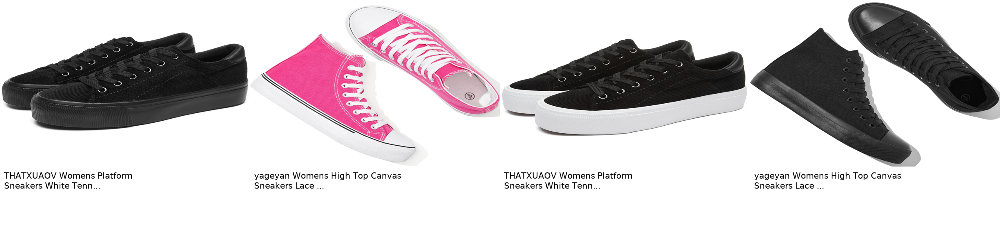

  ✅ Saved collage_cluster_img_0.png
Cluster 1:


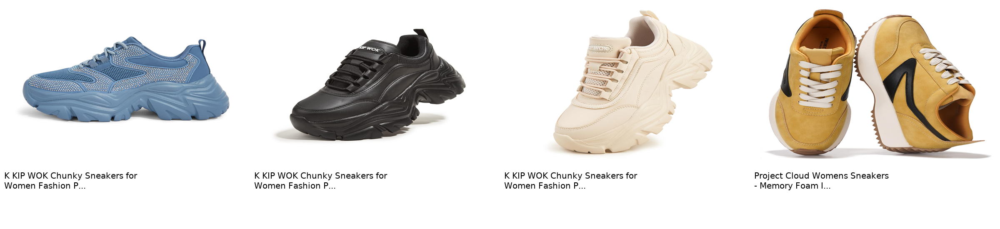

  ✅ Saved collage_cluster_img_1.png
Cluster 2:


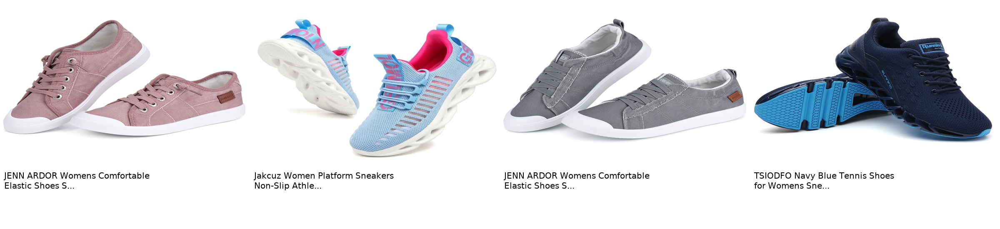

  ✅ Saved collage_cluster_img_2.png
Cluster 3:


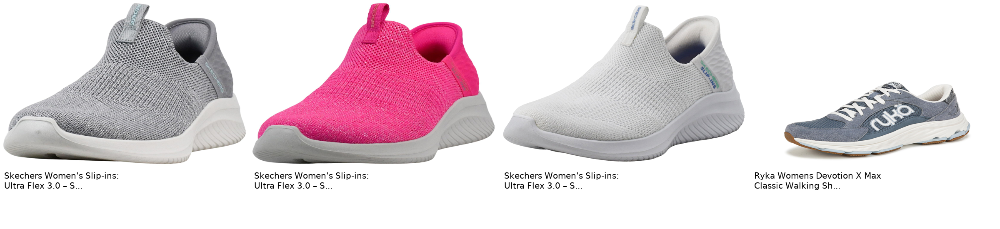

  ✅ Saved collage_cluster_img_3.png
Cluster 4:


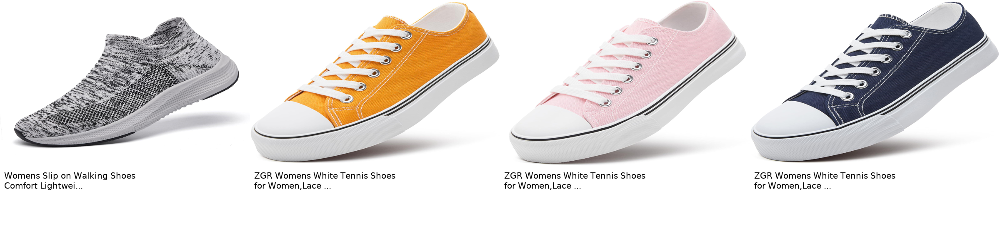

  ✅ Saved collage_cluster_img_4.png


In [22]:
def get_text(asin):
    try:
        t = ds_full.loc[asin, "text"]
        return t.iloc[0] if isinstance(t, pd.Series) else t
    except KeyError:
        try:
            t = ds_full_df.loc[asin, "text"]
            return t.iloc[0] if isinstance(t, pd.Series) else t
        except:
            return "N/A"

def get_image(asin):
    try:
        img_bytes = df_img.loc[asin, "image"]["bytes"]
        return Image.open(io.BytesIO(img_bytes))
    except:
        return Image.new("RGB", (600, 400), (200, 200, 200))

for i, indices in enumerate(closest_points_img[0]):
    print(f"Cluster {i}:")
    images = []
    for idx in indices:
        asin = df_full.loc[int(idx), "ASIN"]
        text = get_text(asin)
        truncated_text = (text[:text_len] + "...") if len(text) > text_len else text

        img = get_image(asin).resize((600, 400))
        unit_canvas = Image.new("RGB", (600, 550), color=(255, 255, 255))
        unit_canvas.paste(img, (0, 0))

        draw  = ImageDraw.Draw(unit_canvas)
        lines = textwrap.wrap(truncated_text, width=30)
        ascent, descent = font.getmetrics()
        y_text = img.height + 10
        for line in lines:
            draw.text((10, y_text), line, font=font, fill=(0, 0, 0))
            y_text += ascent + descent

        images.append(unit_canvas)

    if not images:
        print(f"  No images for Cluster {i}.")
        continue

    grid_columns   = 4
    grid_rows      = int(np.ceil(len(images) / grid_columns))
    collage = Image.new("RGB", (600 * grid_columns, 550 * grid_rows), color=(255, 255, 255))
    for idx, img in enumerate(images):
        collage.paste(img, ((idx % grid_columns) * 600, (idx // grid_columns) * 550))

    collage.save(os.path.join(output_dir, f"collage_cluster_img_{i}.png"))
    display(collage)
    print(f"  ✅ Saved collage_cluster_img_{i}.png")

## ㉒ Cluster Collage — Text Embeddings

Cluster 0:


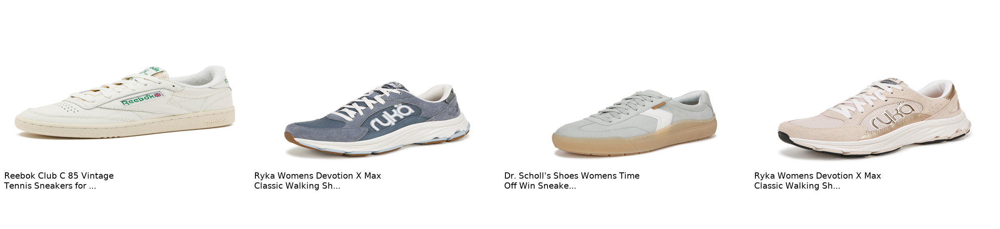

  ✅ Saved collage_cluster_txt_0.png
Cluster 1:


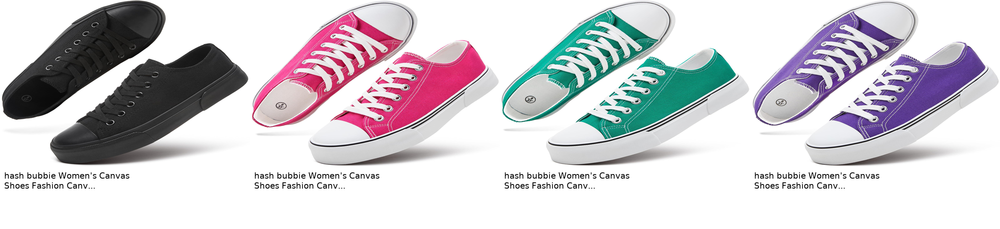

  ✅ Saved collage_cluster_txt_1.png
Cluster 2:


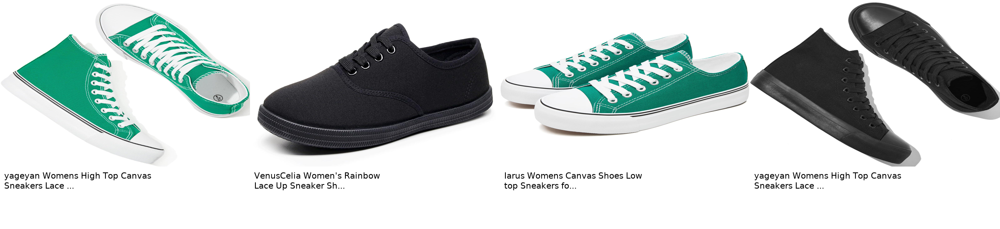

  ✅ Saved collage_cluster_txt_2.png
Cluster 3:


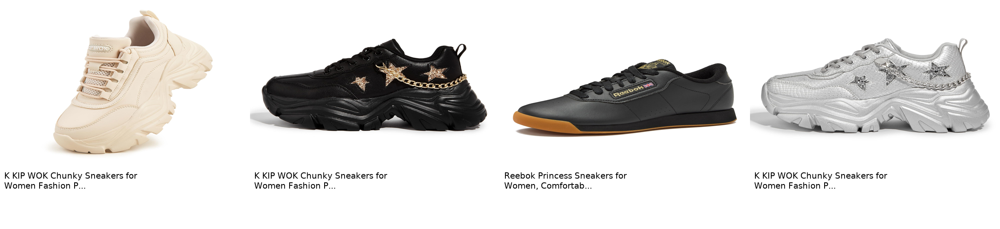

  ✅ Saved collage_cluster_txt_3.png
Cluster 4:


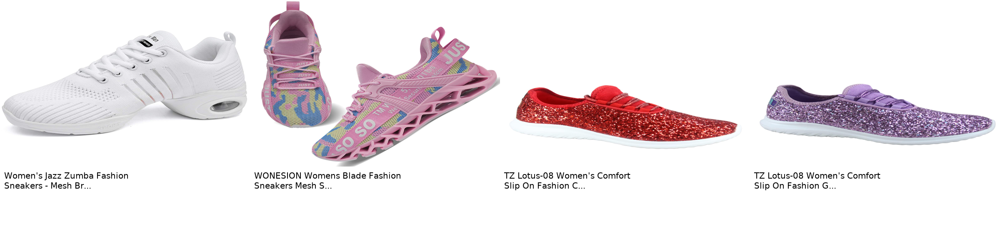

  ✅ Saved collage_cluster_txt_4.png


In [23]:
for i, indices in enumerate(closest_points_txt[0]):
    print(f"Cluster {i}:")
    images = []
    for idx in indices:
        asin = df_full.loc[int(idx), "ASIN"]
        text = get_text(asin)
        truncated_text = (text[:text_len] + "...") if len(text) > text_len else text

        img = get_image(asin).resize((600, 400))
        unit_canvas = Image.new("RGB", (600, 550), color=(255, 255, 255))
        unit_canvas.paste(img, (0, 0))

        draw  = ImageDraw.Draw(unit_canvas)
        lines = textwrap.wrap(truncated_text, width=30)
        ascent, descent = font.getmetrics()
        y_text = img.height + 10
        for line in lines:
            draw.text((10, y_text), line, font=font, fill=(0, 0, 0))
            y_text += ascent + descent

        images.append(unit_canvas)

    if not images:
        print(f"  No images for Cluster {i}.")
        continue

    grid_columns   = 4
    grid_rows      = int(np.ceil(len(images) / grid_columns))
    collage = Image.new("RGB", (600 * grid_columns, 550 * grid_rows), color=(255, 255, 255))
    for idx, img in enumerate(images):
        collage.paste(img, ((idx % grid_columns) * 600, (idx // grid_columns) * 550))

    collage.save(os.path.join(output_dir, f"collage_cluster_txt_{i}.png"))
    display(collage)
    print(f"  ✅ Saved collage_cluster_txt_{i}.png")

## ㉓ Print Cluster Text Descriptions

In [24]:
all_texts_img = {}
for i, indices in enumerate(closest_points_img[0]):
    print(f"Cluster {i}:")
    all_texts_img[i] = []
    for i_idx, idx in enumerate(indices):
        asin = df_full.loc[int(idx), "ASIN"]
        text = get_text(asin)
        all_texts_img[i].append(text)
        print(f"  [{i_idx}] {asin}: {text[:80]}...")
    print()

Cluster 0:
  [0] B09YLQVN6N: THATXUAOV Womens Platform Sneakers White Tennis Shoes Casual Low Top Fashion Sne...
  [1] B0D9H8BDX1: yageyan Womens High Top Canvas Sneakers Lace up Fashion Shoes for Women Casual C...
  [2] B0C13GFPZH: THATXUAOV Womens Platform Sneakers White Tennis Shoes Casual Low Top Fashion Sne...
  [3] B0CNH2JBB8: yageyan Womens High Top Canvas Sneakers Lace up Fashion Shoes for Women Casual C...

Cluster 1:
  [0] B0D11NW48S: K KIP WOK Chunky Sneakers for Women Fashion Platform Rhinestone White Leather Ca...
  [1] B0BLG3BXB4: K KIP WOK Chunky Sneakers for Women Fashion Platform White Leather Casual Dad Sh...
  [2] B0BZPPV5QL: K KIP WOK Chunky Sneakers for Women Fashion Platform White Leather Casual Dad Sh...
  [3] B0DJTZ92VR: Project Cloud Womens Sneakers - Memory Foam Insole and Lightweight Spring Shoes ...

Cluster 2:
  [0] B09RTD9N4P: JENN ARDOR Womens Comfortable Elastic Shoes Stylish Canvas Fashion Sneakers Cute...
  [1] B0CVWVY483: Jakcuz Women Platform Sneaker

In [25]:
all_texts_txt = {}
for i, indices in enumerate(closest_points_txt[0]):
    print(f"Cluster {i}:")
    all_texts_txt[i] = []
    for i_idx, idx in enumerate(indices):
        asin = df_full.loc[int(idx), "ASIN"]
        text = get_text(asin)
        all_texts_txt[i].append(text)
        print(f"  [{i_idx}] {asin}: {text[:80]}...")
    print()

Cluster 0:
  [0] B093TZBS96: Reebok Club C 85 Vintage Tennis Sneakers for Women, Casual White Womens Shoes, S...
  [1] B0D4SNR3JN: Ryka Womens Devotion X Max Classic Walking Shoes Flintstone Blue 8 M | Ryka | Ry...
  [2] B0DGRMVLPP: Dr. Scholl's Shoes Womens Time Off Win Sneaker Ocean Fabric 8 M | Dr. Scholl's S...
  [3] B0DNLS2M6Y: Ryka Womens Devotion X Max Classic Walking Shoes Tapioca Beige 8 M | Ryka | Ryka...

Cluster 1:
  [0] B086YCZV24: hash bubbie Women's Canvas Shoes Fashion Canvas Sneakers for Women Casual Tennis...
  [1] B0D8VVTW4X: hash bubbie Women's Canvas Shoes Fashion Canvas Sneakers for Women Casual Tennis...
  [2] B0D8VX4JW4: hash bubbie Women's Canvas Shoes Fashion Canvas Sneakers for Women Casual Tennis...
  [3] B0D8VV6RBG: hash bubbie Women's Canvas Shoes Fashion Canvas Sneakers for Women Casual Tennis...

Cluster 2:
  [0] B0D9H9327P: yageyan Womens High Top Canvas Sneakers Lace up Fashion Shoes for Women Casual C...
  [1] B0D4HKYZXY: VenusCelia Women's Rainbow La

In [26]:
all_texts_img

{0: ['THATXUAOV Womens Platform Sneakers White Tennis Shoes Casual Low Top Fashion Sneakers(Black,US8 | THATXUAOV | Black | 8',
  'yageyan Womens High Top Canvas Sneakers Lace up Fashion Shoes for Women Casual Classic（pink08） | yageyan | Pink | 8',
  'THATXUAOV Womens Platform Sneakers White Tennis Shoes Casual Low Top Fashion Sneakers(Black White,US8 | THATXUAOV | THATXUAOV-PWS-001 | Black White | 8',
  'yageyan Womens High Top Canvas Sneakers Lace up Fashion Shoes for Women Casual Classic（All black08） | yageyan | All Black | 8'],
 1: ['K KIP WOK Chunky Sneakers for Women Fashion Platform Rhinestone White Leather Casual Dad Shoes Comfortable Wedge Walking Sport Sneakers(Blue Rhinestone,8) | K KIP WOK | K KIP WOK | Blue Rhinestone | 8',
  'K KIP WOK Chunky Sneakers for Women Fashion Platform White Leather Casual Dad Shoes Comfortable Wedge Walking Sport Sneakers(Black,8) | K KIP WOK | KW-DS001 | Black | 8',
  'K KIP WOK Chunky Sneakers for Women Fashion Platform White Leather Casual Da

In [27]:
all_texts_txt

{0: ['Reebok Club C 85 Vintage Tennis Sneakers for Women, Casual White Womens Shoes, Size 5 to 11 - Chalk/Alabaster/Glen Green, 8 Medium | Reebok | Reebok | 71733 | Chalk/Alabaster/Glen Green | 8',
  'Ryka Womens Devotion X Max Classic Walking Shoes Flintstone Blue 8 M | Ryka | Ryka | J2245M1400 | Flintstone Blue Fabric | 8',
  "Dr. Scholl's Shoes Womens Time Off Win Sneaker Ocean Fabric 8 M | Dr. Scholl's Shoes | Dr.Scholl's SHOES | J3509F2300 | Ocean Fabric | 8",
  'Ryka Womens Devotion X Max Classic Walking Shoes Tapioca Beige 8 M | Ryka | Ryka | J2245M3250 | Tapioca Beige | 8'],
 1: ["hash bubbie Women's Canvas Shoes Fashion Canvas Sneakers for Women Casual Tennis Shoes Low Top Walking Shoes(Full Black,US8) | hash bubbie | Full Black | 8",
  "hash bubbie Women's Canvas Shoes Fashion Canvas Sneakers for Women Casual Tennis Shoes Low Top Walking Shoes(Rose Red.US8) | hash bubbie | Rose Red | 8",
  "hash bubbie Women's Canvas Shoes Fashion Canvas Sneakers for Women Casual Tennis Shoes